In [ ]:
import torch
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import numpy as np

In [ ]:
# ============================================================
# Chen system — CD scheme
# ============================================================
@torch.jit.script
def chen_cd_step(x, y, z, a, b, c, h, s: float):
    h1 = s * h
    h2 = (1.0 - s) * h

    x1 = (x + h1 * a * y) / (1.0 + h1 * a)
    y1 = (y + h1 * ((c - a) * x1 - x1 * z)) / (1.0 - h1 * c)
    z1 = (z + h1 * x1 * y1) / (1.0 + h1 * b)

    z2 = z1 + h2 * (x1 * y1 - b * z1)
    y2 = y1 + h2 * ((c - a) * x1 - x1 * z2 + c * y1)
    x2 = x1 + h2 * a * (y2 - x1)

    return x2, y2, z2


# ============================================================
# Pecora–Carroll step
# ============================================================
@torch.jit.script
def pc_step(
    x1, y1, z1,
    x2, y2, z2,
    a, b, c,
    h, s: float,
    mask_x: float,
    mask_y: float,
    mask_z: float,
    coupling_mode: int
):
    # подмена
    if coupling_mode == 0:  # uni
        if mask_x == 1.0: x2 = x1
        if mask_y == 1.0: y2 = y1
        if mask_z == 1.0: z2 = z1
    else:  # bi
        if mask_x == 1.0: x1, x2 = x2, x1
        if mask_y == 1.0: y1, y2 = y2, y1
        if mask_z == 1.0: z1, z2 = z2, z1

    x1, y1, z1 = chen_cd_step(x1, y1, z1, a, b, c, h, s)
    x2, y2, z2 = chen_cd_step(x2, y2, z2, a, b, c, h, s)

    return x1, y1, z1, x2, y2, z2


# ============================================================
# PD step
# ============================================================
@torch.jit.script
def pd_step(
    x1, y1, z1,
    x2, y2, z2,
    e_prev,
    de_prev,
    a, b, c,
    kp, kd,
    h, s: float,
    alpha: float,
    mask_x: float,
    mask_y: float,
    mask_z: float,
    coupling_mode: int   # 0 = uni, 1 = bi
):
    # --------------------------------------------------------
    # Ошибка по разрешённым каналам
    # --------------------------------------------------------
    ex = mask_x * (x2 - x1)
    ey = mask_y * (y2 - y1)
    ez = mask_z * (z2 - z1)

    e = torch.stack((ex, ey, ez))

    # --------------------------------------------------------
    # Фильтрованная производная
    # --------------------------------------------------------
    de_raw = (e - e_prev) / h
    de = alpha * de_prev + (1.0 - alpha) * de_raw

    # --------------------------------------------------------
    # PD управление
    # --------------------------------------------------------
    ux = kp * ex + kd * de[0]
    uy = kp * ey + kd * de[1]
    uz = kp * ez + kd * de[2]

    # --------------------------------------------------------
    # Применение управления
    # --------------------------------------------------------
    if coupling_mode == 0:  # uni
        if mask_x == 1.0: x1 += ux
        if mask_y == 1.0: y1 += uy
        if mask_z == 1.0: z1 += uz
    else:                  # bi
        if mask_x == 1.0:
            x1 += ux
            x2 -= ux
        if mask_y == 1.0:
            y1 += uy
            y2 -= uy
        if mask_z == 1.0:
            z1 += uz
            z2 -= uz

    # --------------------------------------------------------
    # Один шаг CD
    # --------------------------------------------------------
    x1, y1, z1 = chen_cd_step(x1, y1, z1, a, b, c, h, s)
    x2, y2, z2 = chen_cd_step(x2, y2, z2, a, b, c, h, s)

    return x1, y1, z1, x2, y2, z2, e, de

# ============================================================
# Unified simulator
# ============================================================
def simulate(
    method="PC",               # "PC" | "PD"
    coupling="uni",             # "uni" | "bi"
    sync_vars=("y",),
    x0_1=(1,1,1),
    x0_2=(5,-3,10),
    a=40., b=3., c=28.,
    kp=5., kd=0.5,
    h=0.001, s=0.5,
    alpha=0.9,
    steps=20000,
    device="cuda"
):
    device = device if torch.cuda.is_available() else "cpu"

    mask = {
        "x": 1.0 if "x" in sync_vars else 0.0,
        "y": 1.0 if "y" in sync_vars else 0.0,
        "z": 1.0 if "z" in sync_vars else 0.0
    }

    coupling_mode = 0 if coupling == "uni" else 1

    x1, y1, z1 = [torch.tensor(v, device=device, dtype=torch.float32) for v in x0_1]
    x2, y2, z2 = [torch.tensor(v, device=device, dtype=torch.float32) for v in x0_2]

    a = torch.tensor(a, device=device)
    b = torch.tensor(b, device=device)
    c = torch.tensor(c, device=device)
    kp = torch.tensor(kp, device=device)
    kd = torch.tensor(kd, device=device)
    h = torch.tensor(h, device=device)
    alpha = torch.tensor(alpha, device=device)

    traj1 = torch.zeros((steps,3), device=device)
    traj2 = torch.zeros((steps,3), device=device)
    err   = torch.zeros((steps,3), device=device)

    e_prev  = torch.zeros(3, device=device, dtype=torch.float32)
    de_prev = torch.zeros(3, device=device, dtype=torch.float32)

    for i in range(steps):
        if method == "PC":
            x1,y1,z1,x2,y2,z2 = pc_step(
                x1,y1,z1,x2,y2,z2,
                a,b,c,h,s,
                mask["x"],mask["y"],mask["z"],
                coupling_mode
            )
        elif method == "PD":
            x1,y1,z1,x2,y2,z2,e_prev,de_prev = pd_step(
                x1,y1,z1,x2,y2,z2,
                e_prev,de_prev,
                a,b,c,kp,kd,
                h,s,
                alpha,
                mask["x"],mask["y"],mask["z"],
                coupling_mode
            )
        else:
            raise ValueError("method must be 'PC' or 'PD'")

        traj1[i] = torch.stack((x1,y1,z1))
        traj2[i] = torch.stack((x2,y2,z2))
        err[i]   = torch.abs(traj1[i]-traj2[i])

    return traj1.cpu().numpy(), traj2.cpu().numpy(), err.cpu().numpy()

def sync_metric(err, tail_frac=0.2):
    """
    err: np.ndarray (T,3)
    """
    tail = err[int((1.0 - tail_frac) * len(err)):]
    return np.mean(np.linalg.norm(tail, axis=1))

def grid_search_kp_kd(
    kp_values,
    kd_values,
    **simulate_kwargs
):
    results = []

    for kp in kp_values:
        for kd in kd_values:
            traj1, traj2, err = simulate(
                method="PD",
                kp=kp,
                kd=kd,
                **simulate_kwargs
            )

            score = sync_metric(err)

            results.append({
                "kp": kp,
                "kd": kd,
                "score": score
            })

            print(f"kp={kp:.3f}, kd={kd:.3f} → score={score:.3e}")

    return results

def plot_kp_kd_map(results):
    kp = np.array([r["kp"] for r in results])
    kd = np.array([r["kd"] for r in results])
    score = np.array([r["score"] for r in results])

    plt.figure(figsize=(6, 5), dpi=200)
    sc = plt.scatter(kp, kd, c=score, cmap="viridis", s=40)
    plt.colorbar(sc, label="mean sync error")
    plt.xlabel("kp")
    plt.ylabel("kd")
    plt.title("PD synchronization map")
    plt.tight_layout()
    plt.show()

# ============================================================
# Interactive error plot
# ============================================================
def plot_errors(err, h, cut=3000):
    err = err[cut:]
    t = np.arange(len(err))*h

    fig = go.Figure()
    for i,name in enumerate(["x","y","z"]):
        fig.add_trace(go.Scatter(
            x=t, y=err[:,i],
            name=f"|e_{name}|"
        ))

    fig.update_layout(
        title="Synchronization error",
        yaxis_type="log",
        hovermode="x unified"
    )
    fig.show()

def plot_sync_errors_static(err_xyz, h, cut=0):
    """
    err_xyz: np.ndarray (T,3) = |x1-x2|, |y1-y2|, |z1-z2|
    """

    err_xyz = err_xyz[cut:]
    t = np.arange(len(err_xyz)) * h

    plt.figure(figsize=(8, 4), dpi=200)

    plt.plot(t, err_xyz[:, 0], label="|e_x(t)|")
    plt.plot(t, err_xyz[:, 1], label="|e_y(t)|")
    plt.plot(t, err_xyz[:, 2], label="|e_z(t)|")

    plt.yscale("log")
    plt.xlabel("Time")
    plt.ylabel("Synchronization error")
    plt.title("Synchronization errors")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_sync_phase_portrait(traj_m, traj_s, cut=3000, sync_var='y', method='PC'):
    traj_m = traj_m[cut:]
    traj_s = traj_s[cut:]

    error = np.linalg.norm(traj_m - traj_s, axis=1)
    error = np.clip(error, 0, np.percentile(error, 95))

    fig = plt.figure(figsize=(8, 7), dpi=200)
    ax = fig.add_subplot(111, projection="3d")

    sc = ax.scatter(
        traj_m[:, 0],
        traj_m[:, 1],
        traj_m[:, 2],
        c=error,
        cmap="turbo",
        s=1,
        linewidth=0
    )

    cbar = plt.colorbar(sc, ax=ax, pad=0.1)
    cbar.set_label("Synchronization error |e(t)|")

    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.set_title(f"Chen system {sync_var}-synchronization ({'Pecora–Carroll' if method == 'PC' else 'PD'})")

    plt.tight_layout()
    plt.show()

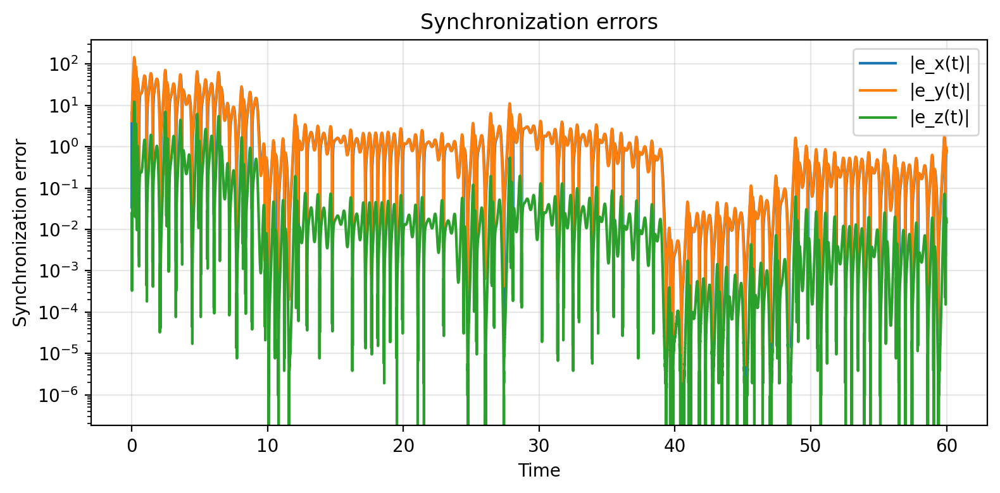

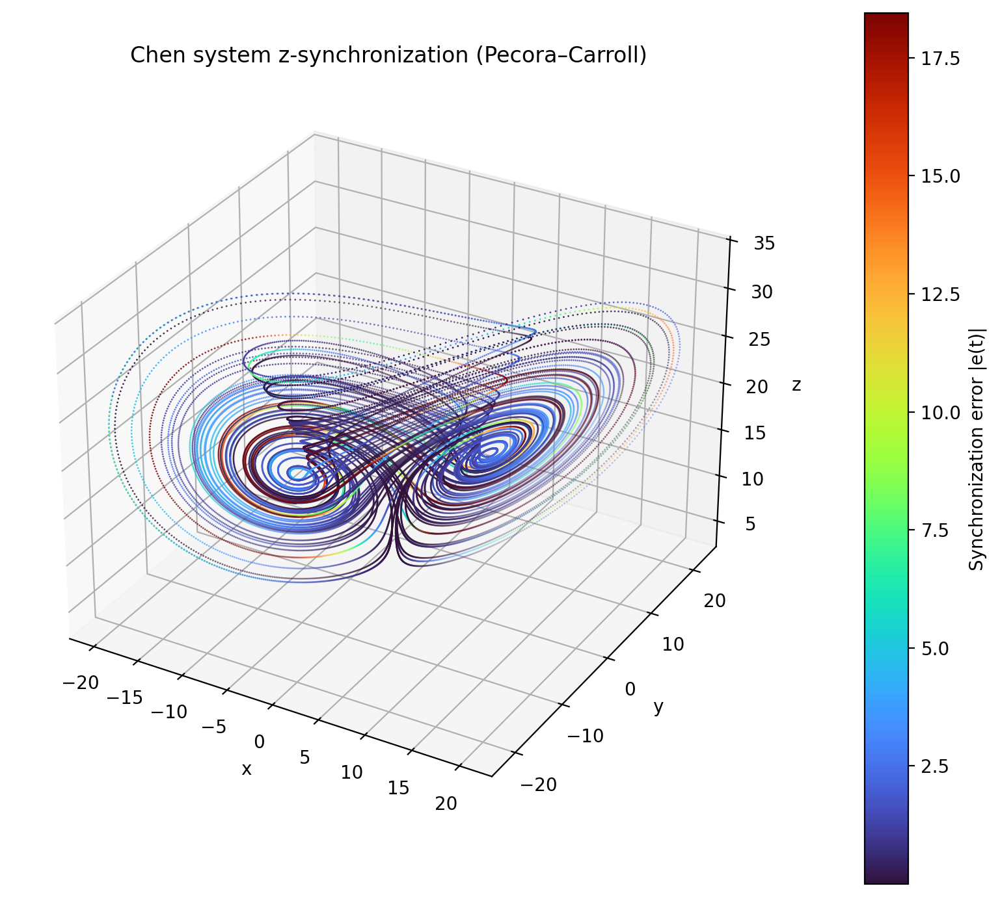

In [ ]:
traj1, traj2, err = simulate(
    method="PC",
    coupling="uni",
    sync_vars=("x",),
    x0_1=(1.0, 1.0, 1.0),
    x0_2=(8.0, -3.0, 10.0),
    h=0.001,
    steps=25000
)

plot_sync_errors_static(err, h=0.001)
plot_errors(err, h=0.001)
plot_sync_phase_portrait(traj1, traj2, sync_var="x")


kp=0.010, kd=0.000 → score=2.633e+01
kp=0.010, kd=0.010 → score=1.702e+03
kp=0.010, kd=0.020 → score=nan
kp=0.064, kd=0.000 → score=9.305e+01
kp=0.064, kd=0.010 → score=1.531e+03
kp=0.064, kd=0.020 → score=nan
kp=0.119, kd=0.000 → score=1.680e+02
kp=0.119, kd=0.010 → score=1.345e+03
kp=0.119, kd=0.020 → score=nan
kp=0.173, kd=0.000 → score=2.478e+02
kp=0.173, kd=0.010 → score=1.143e+03
kp=0.173, kd=0.020 → score=nan
kp=0.228, kd=0.000 → score=3.328e+02
kp=0.228, kd=0.010 → score=9.295e+02
kp=0.228, kd=0.020 → score=nan
kp=0.282, kd=0.000 → score=4.232e+02
kp=0.282, kd=0.010 → score=7.422e+02
kp=0.282, kd=0.020 → score=nan
kp=0.337, kd=0.000 → score=5.195e+02
kp=0.337, kd=0.010 → score=6.824e+02
kp=0.337, kd=0.020 → score=nan
kp=0.391, kd=0.000 → score=6.224e+02
kp=0.391, kd=0.010 → score=7.002e+02
kp=0.391, kd=0.020 → score=nan
kp=0.446, kd=0.000 → score=7.325e+02
kp=0.446, kd=0.010 → score=7.836e+02
kp=0.446, kd=0.020 → score=nan
kp=0.500, kd=0.000 → score=8.507e+02
kp=0.500, kd=0.010

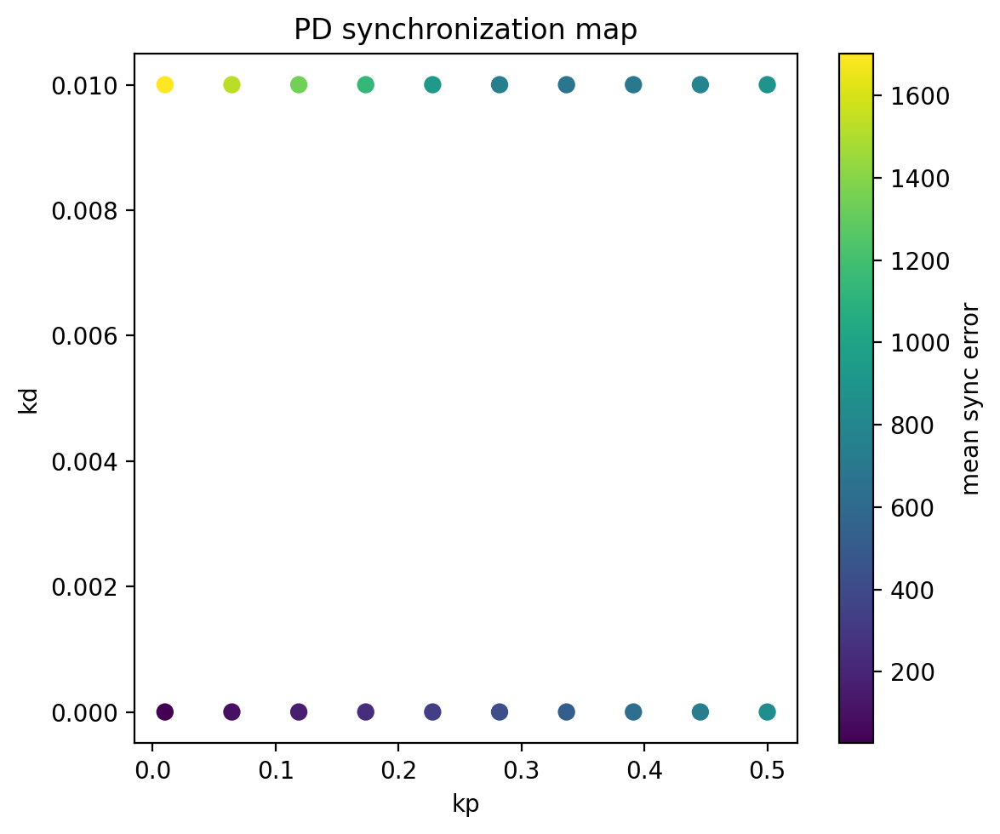

In [ ]:
kp_grid = np.linspace(0.01, 0.5, 10)
kd_grid = np.linspace(0, 0.02, 3)

results = grid_search_kp_kd(
    kp_grid,
    kd_grid,
    coupling="uni",
    sync_vars=("x",),
    steps=15000,
    h=0.001,
    s=0.5,
    alpha=0.9
)

best = min(results, key=lambda r: r["score"])
print("BEST:", best)
plot_kp_kd_map(results)


In [ ]:
kp_grid = np.linspace(0.5, 12.0, 20)
kd_grid = np.linspace(0.001, 2, 20)

results = grid_search_kp_kd(
    kp_grid,
    kd_grid,
    coupling="uni",
    sync_vars=("y",),
    steps=15000,
    h=0.001,
    s=0.5,
    alpha=0.9
)

best = min(results, key=lambda r: r["score"])
print("BEST:", best)
plot_kp_kd_map(results)


kp=0.500, kd=0.001 → score=0.000e+00
kp=0.500, kd=0.106 → score=nan
kp=0.500, kd=0.211 → score=nan
kp=0.500, kd=0.317 → score=nan
kp=0.500, kd=0.422 → score=nan
kp=0.500, kd=0.527 → score=nan
kp=0.500, kd=0.632 → score=nan
kp=0.500, kd=0.737 → score=nan
kp=0.500, kd=0.843 → score=nan
kp=0.500, kd=0.948 → score=nan
kp=0.500, kd=1.053 → score=nan
kp=0.500, kd=1.158 → score=nan
kp=0.500, kd=1.264 → score=nan
kp=0.500, kd=1.369 → score=nan
kp=0.500, kd=1.474 → score=nan
kp=0.500, kd=1.579 → score=nan
kp=0.500, kd=1.684 → score=nan
kp=0.500, kd=1.790 → score=nan
kp=0.500, kd=1.895 → score=nan
kp=0.500, kd=2.000 → score=nan
kp=1.105, kd=0.001 → score=0.000e+00
kp=1.105, kd=0.106 → score=nan
kp=1.105, kd=0.211 → score=nan
kp=1.105, kd=0.317 → score=nan
kp=1.105, kd=0.422 → score=nan
kp=1.105, kd=0.527 → score=nan
kp=1.105, kd=0.632 → score=nan
kp=1.105, kd=0.737 → score=nan
kp=1.105, kd=0.843 → score=nan
kp=1.105, kd=0.948 → score=nan
kp=1.105, kd=1.053 → score=nan
kp=1.105, kd=1.158 → score=

KeyboardInterrupt: 

kp=0.100, kd=0.000 → score=1.408e+01
kp=0.100, kd=0.010 → score=9.376e+00
kp=0.100, kd=0.020 → score=nan
kp=0.311, kd=0.000 → score=9.234e+00
kp=0.311, kd=0.010 → score=9.268e+00
kp=0.311, kd=0.020 → score=nan
kp=0.522, kd=0.000 → score=9.755e+00
kp=0.522, kd=0.010 → score=9.537e+00
kp=0.522, kd=0.020 → score=nan
kp=0.733, kd=0.000 → score=1.005e+01
kp=0.733, kd=0.010 → score=9.856e+00
kp=0.733, kd=0.020 → score=nan
kp=0.944, kd=0.000 → score=1.019e+01
kp=0.944, kd=0.010 → score=1.004e+01
kp=0.944, kd=0.020 → score=nan
kp=1.156, kd=0.000 → score=1.026e+01
kp=1.156, kd=0.010 → score=nan
kp=1.156, kd=0.020 → score=nan
kp=1.367, kd=0.000 → score=1.030e+01
kp=1.367, kd=0.010 → score=nan
kp=1.367, kd=0.020 → score=nan
kp=1.578, kd=0.000 → score=1.033e+01
kp=1.578, kd=0.010 → score=nan
kp=1.578, kd=0.020 → score=nan
kp=1.789, kd=0.000 → score=1.035e+01
kp=1.789, kd=0.010 → score=nan
kp=1.789, kd=0.020 → score=nan
kp=2.000, kd=0.000 → score=1.036e+01
kp=2.000, kd=0.010 → score=nan
kp=2.000, k

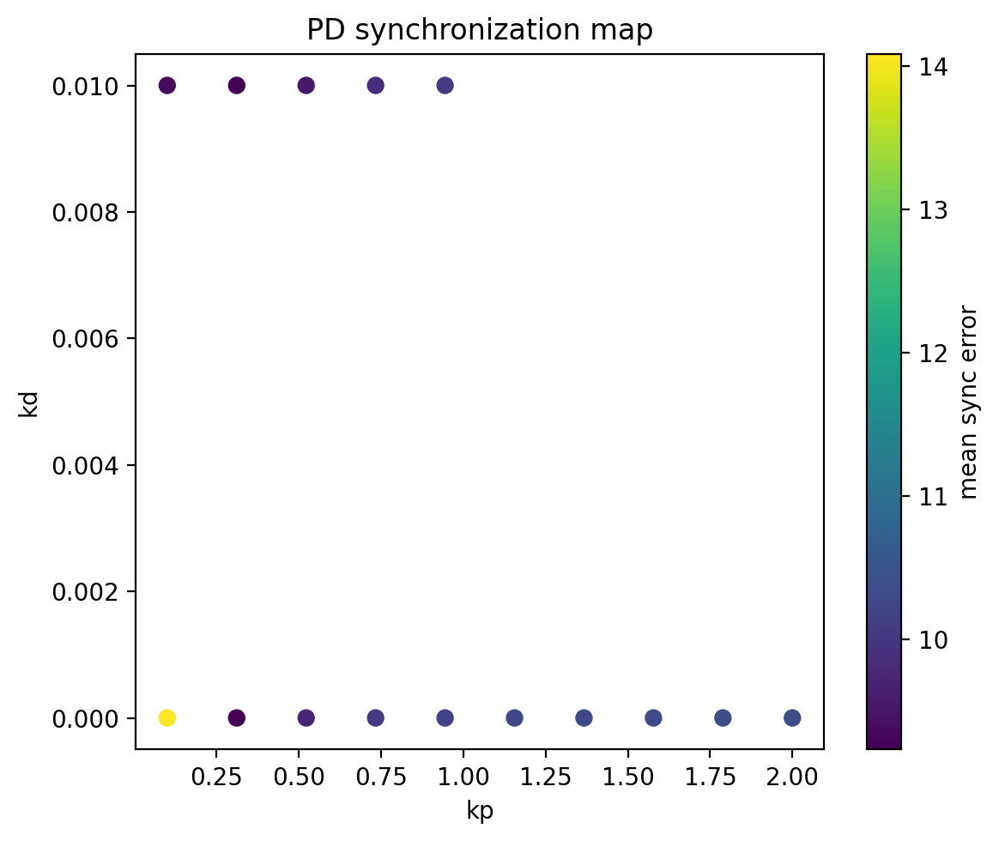

In [ ]:
kp_grid = np.linspace(0.1, 2.0, 10)
kd_grid = np.linspace(0, 0.02, 3)

results = grid_search_kp_kd(
    kp_grid,
    kd_grid,
    coupling="uni",
    sync_vars=("z",),
    steps=15000,
    h=0.001,
    s=0.5,
    alpha=0.9
)

best = min(results, key=lambda r: r["score"])
print("BEST:", best)
plot_kp_kd_map(results)


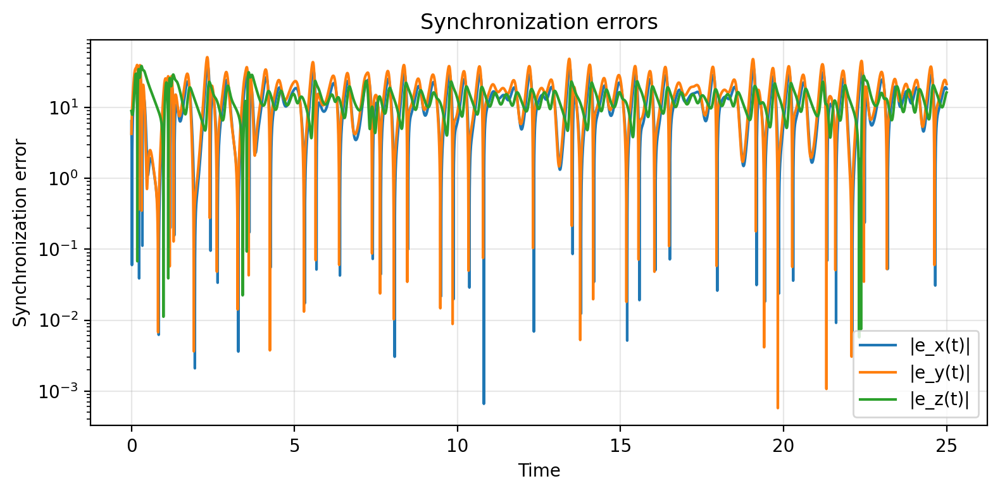

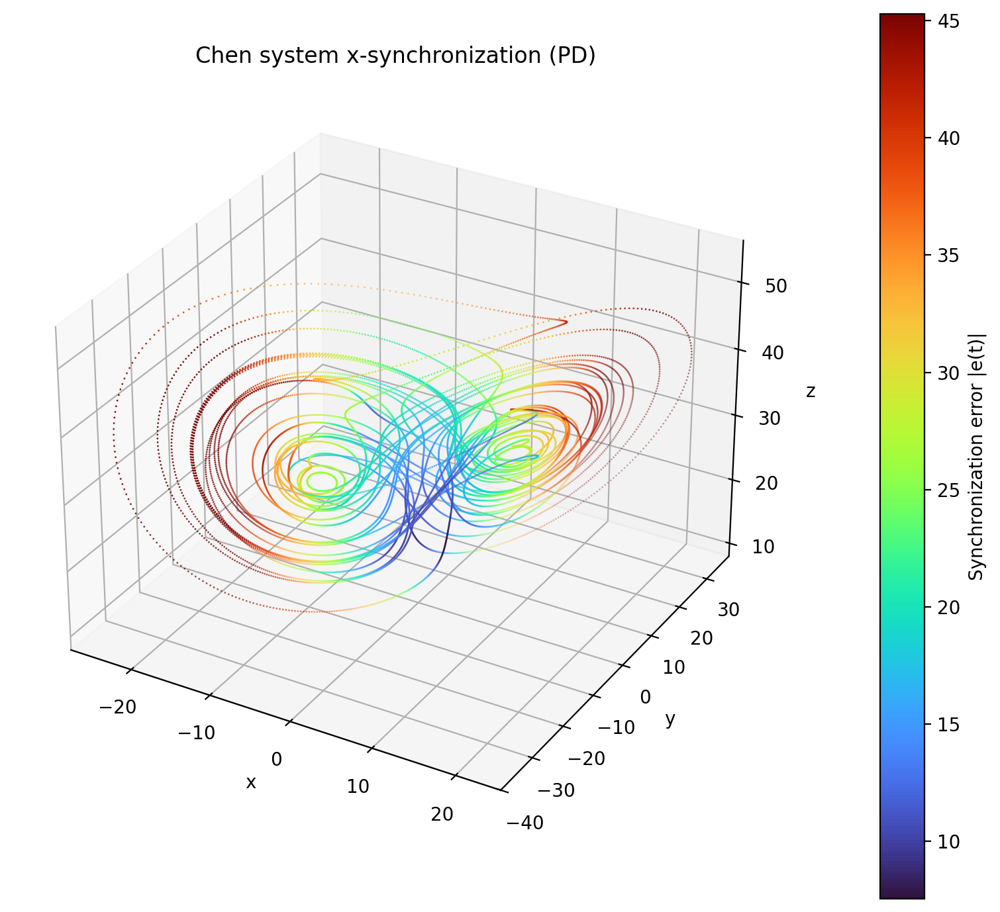

In [ ]:
sync_var = "x"
method="PD"

traj1, traj2, err = simulate(
    method=method,
    coupling="uni",
    sync_vars=(sync_var,),
    x0_1=(1.0, 1.0, 1.0),
    x0_2=(8.0, -3.0, 10.0),
    kp=0.01, kd=0.0001,
    h=0.001,
    steps=25000
)

plot_sync_errors_static(err, h=0.001)
plot_errors(err, h=0.001)
plot_sync_phase_portrait(traj1, traj2, sync_var=sync_var, method=method)


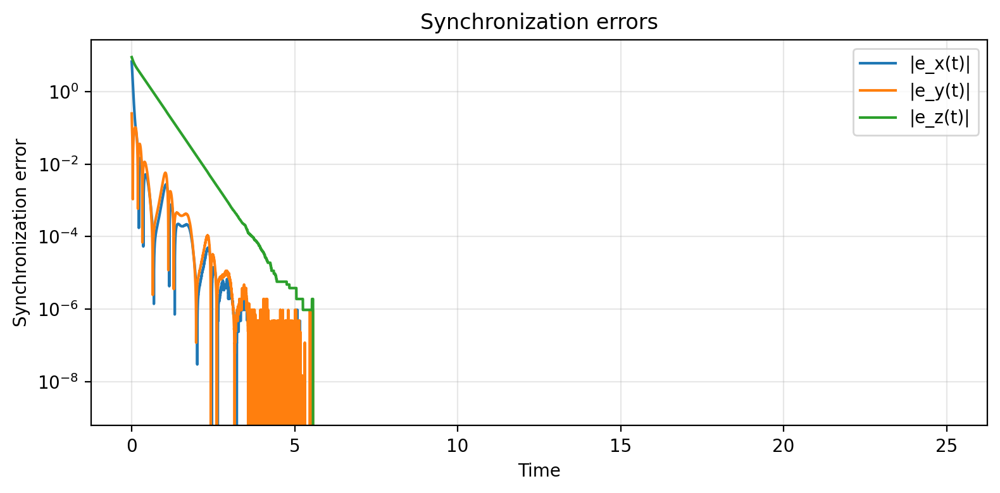

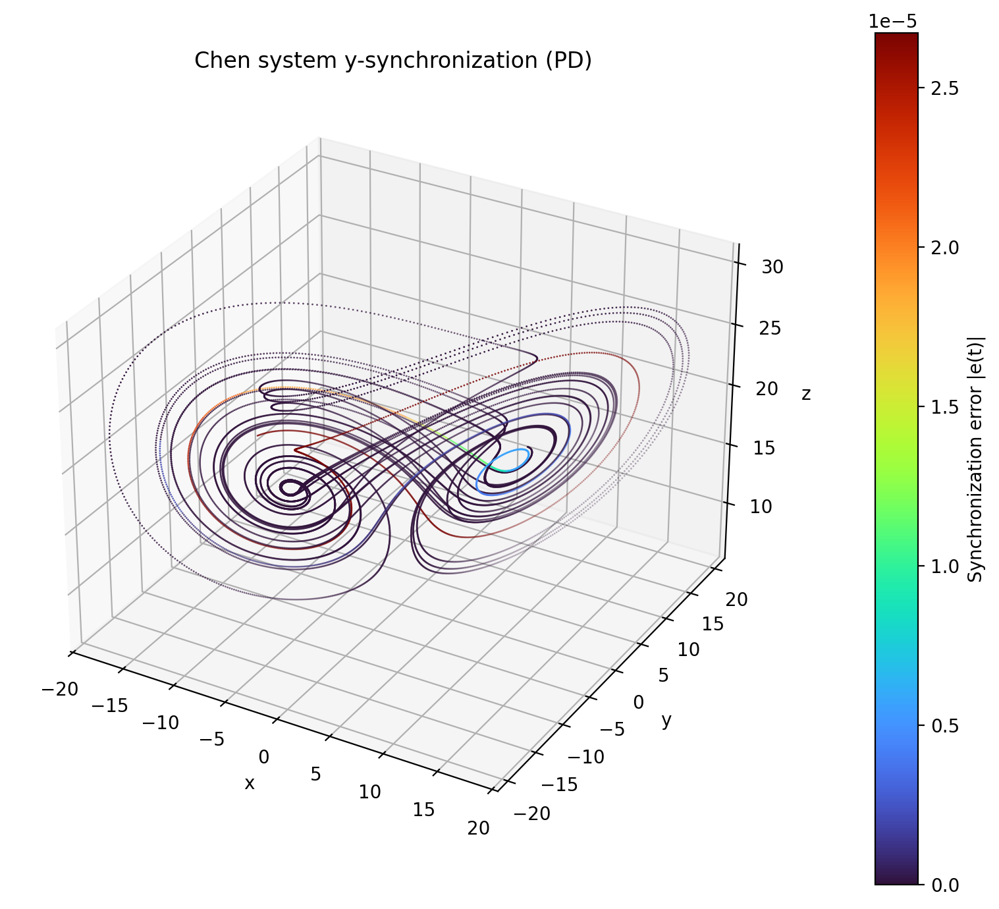

In [ ]:
sync_var = "y"
method="PD"

traj1, traj2, err = simulate(
    method=method,
    coupling="uni",
    sync_vars=(sync_var,),
    x0_1=(1.0, 1.0, 1.0),
    x0_2=(8.0, -3.0, 10.0),
    kp=1, kd=0.001,
    h=0.001,
    steps=25000
)

plot_sync_errors_static(err, h=0.001)
plot_errors(err, h=0.001)
plot_sync_phase_portrait(traj1, traj2, sync_var=sync_var, method=method)


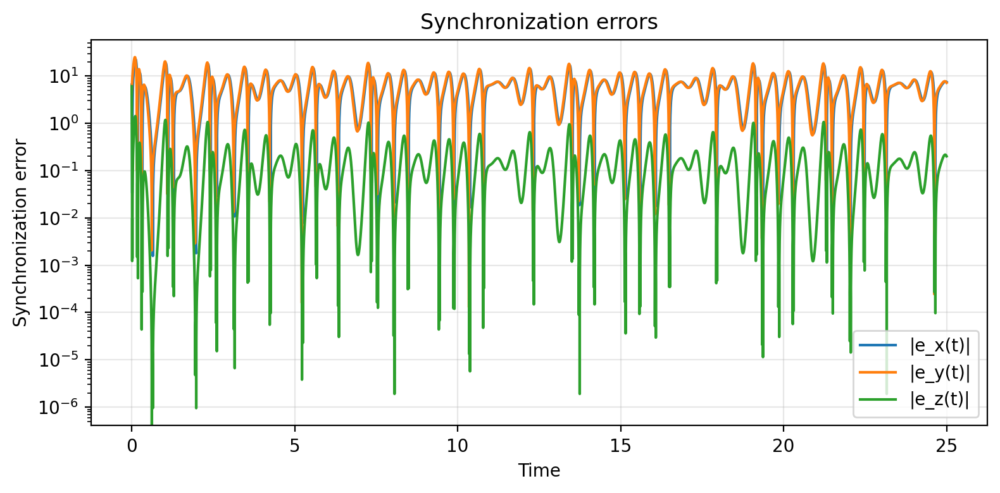

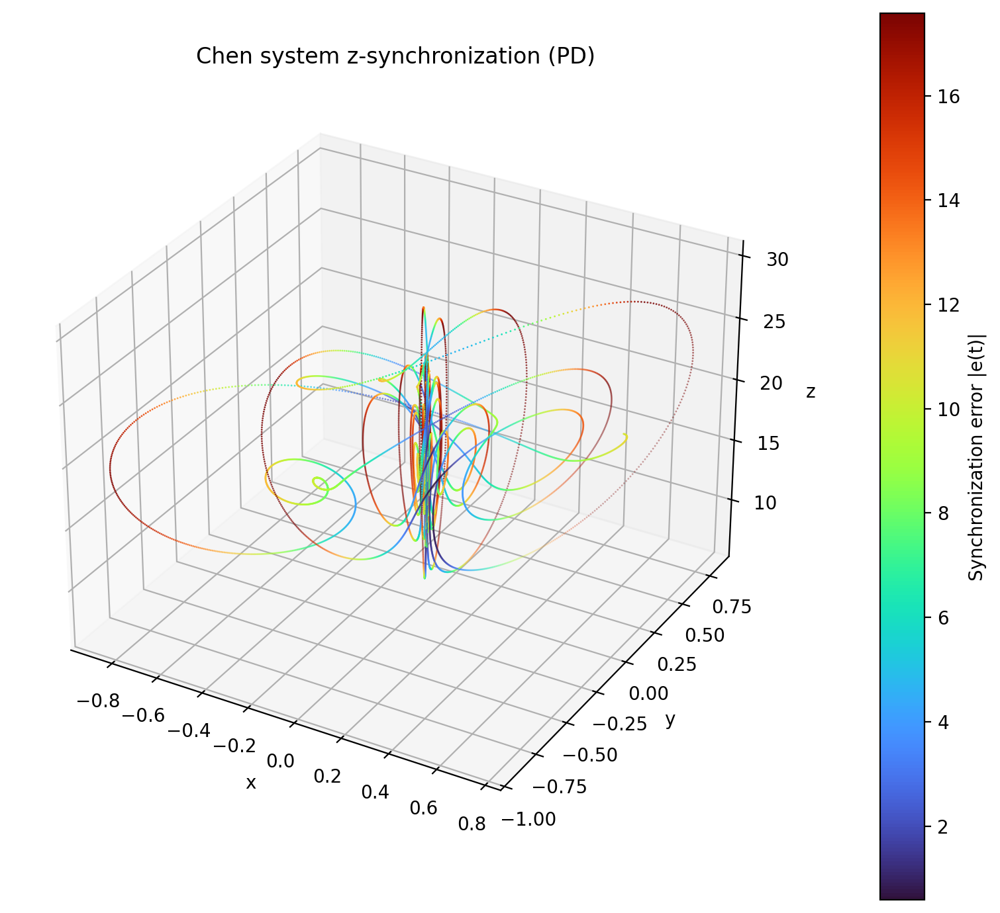

In [ ]:
sync_var = "z"
method="PD"

traj1, traj2, err = simulate(
    method=method,
    coupling="uni",
    sync_vars=(sync_var,),
    x0_1=(1.0, 1.0, 1.0),
    x0_2=(8.0, -3.0, 10.0),
    kp=0.31, kd=0.0001,
    h=0.001,
    steps=25000
)

plot_sync_errors_static(err, h=0.001)
plot_errors(err, h=0.001)
plot_sync_phase_portrait(traj1, traj2, sync_var=sync_var, method=method)


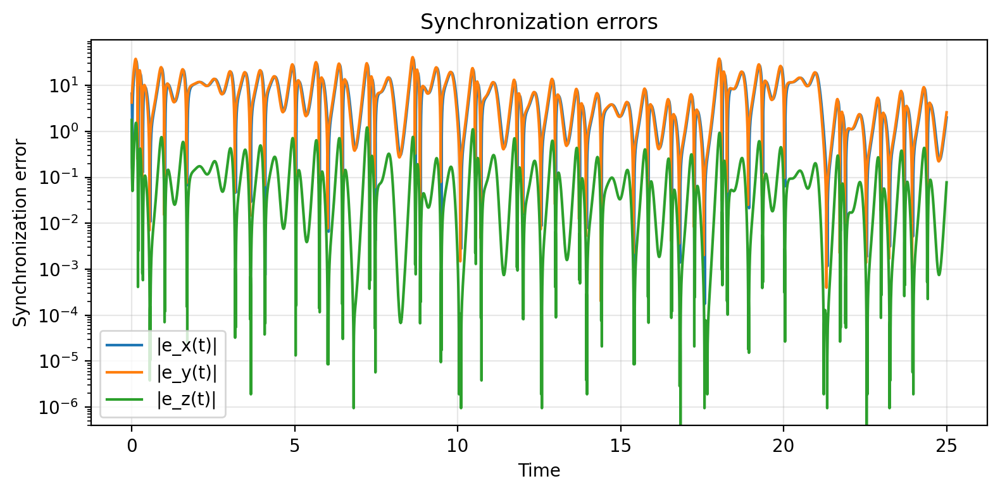

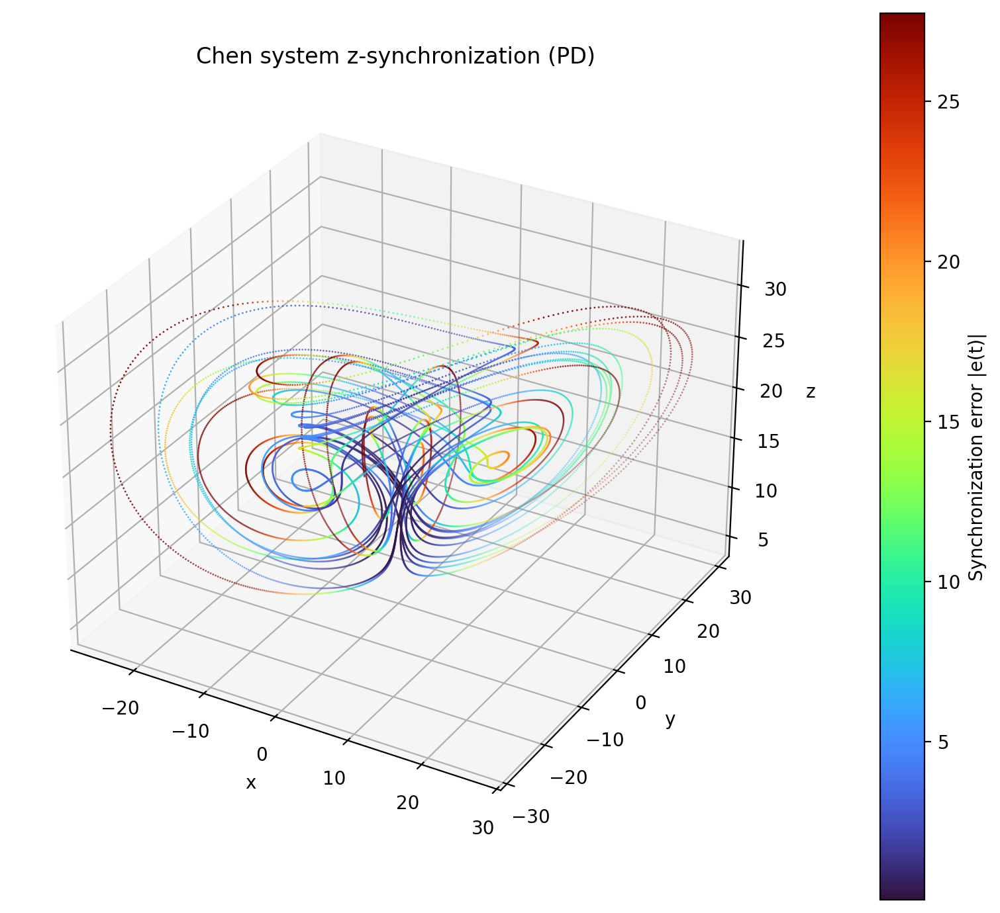

In [ ]:
sync_var = "z"
method="PD"

traj1, traj2, err = simulate(
    method=method,
    coupling="bi",
    sync_vars=(sync_var,),
    x0_1=(1.0, 1.0, 1.0),
    x0_2=(8.0, -3.0, 10.0),
    kp=0.3, kd=0.001,
    h=0.001,
    steps=25000
)

plot_sync_errors_static(err, h=0.001)
plot_errors(err, h=0.001)
plot_sync_phase_portrait(traj1, traj2, sync_var=sync_var, method=method)


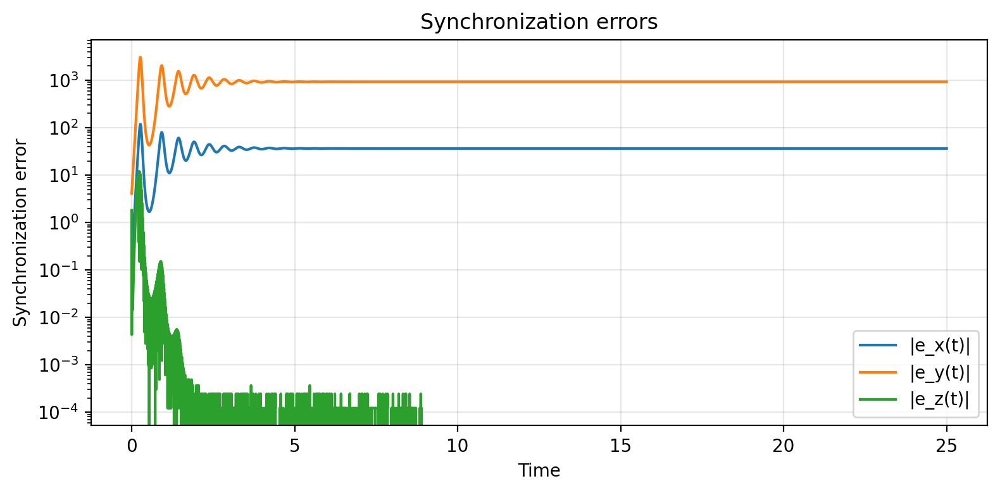

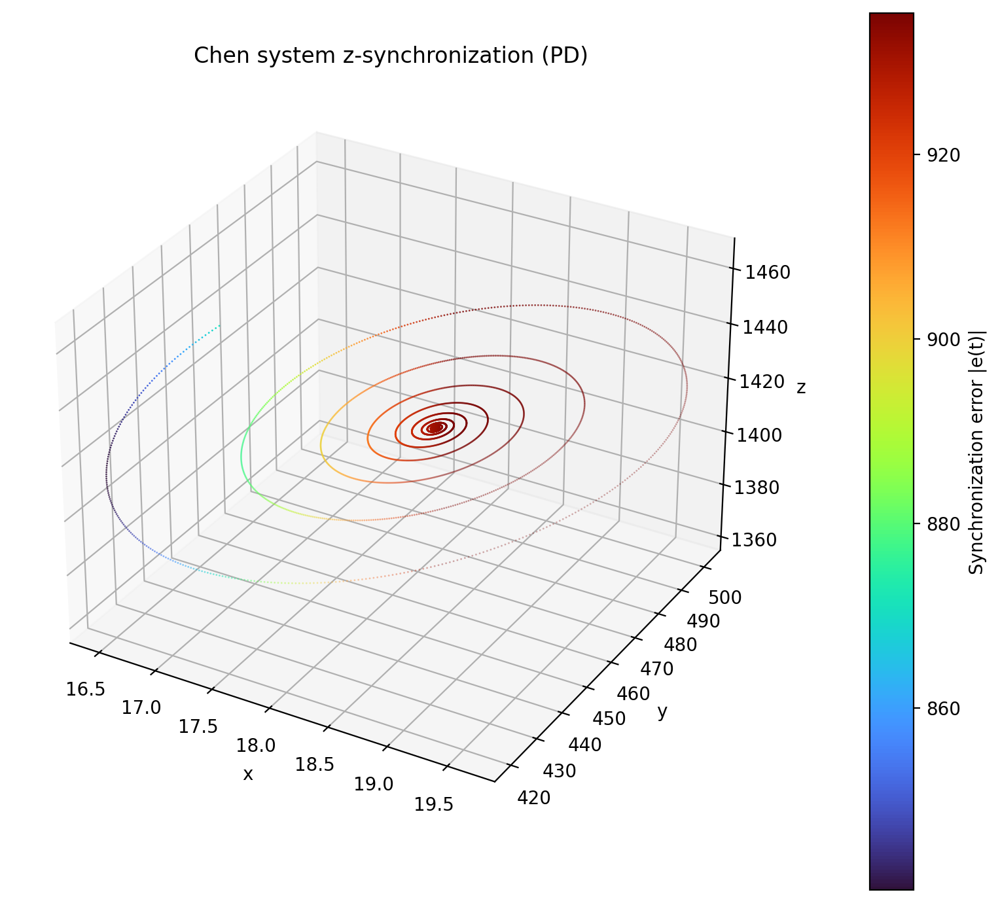

In [ ]:
method="PD"

traj1, traj2, err = simulate(
    method=method,
    coupling="bi",
    sync_vars=("x", "z"),
    x0_1=(1.0, 1.0, 1.0),
    x0_2=(8.0, -3.0, 10.0),
    kp=0.5, kd=0.001,
    h=0.001,
    steps=25000
)

plot_sync_errors_static(err, h=0.001)
plot_errors(err, h=0.001)
plot_sync_phase_portrait(traj1, traj2, sync_var=sync_var, method=method)


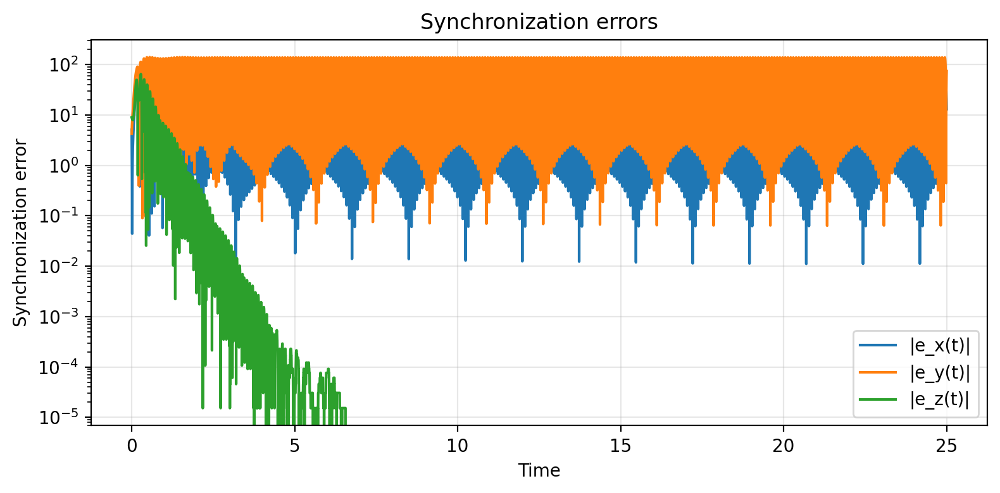

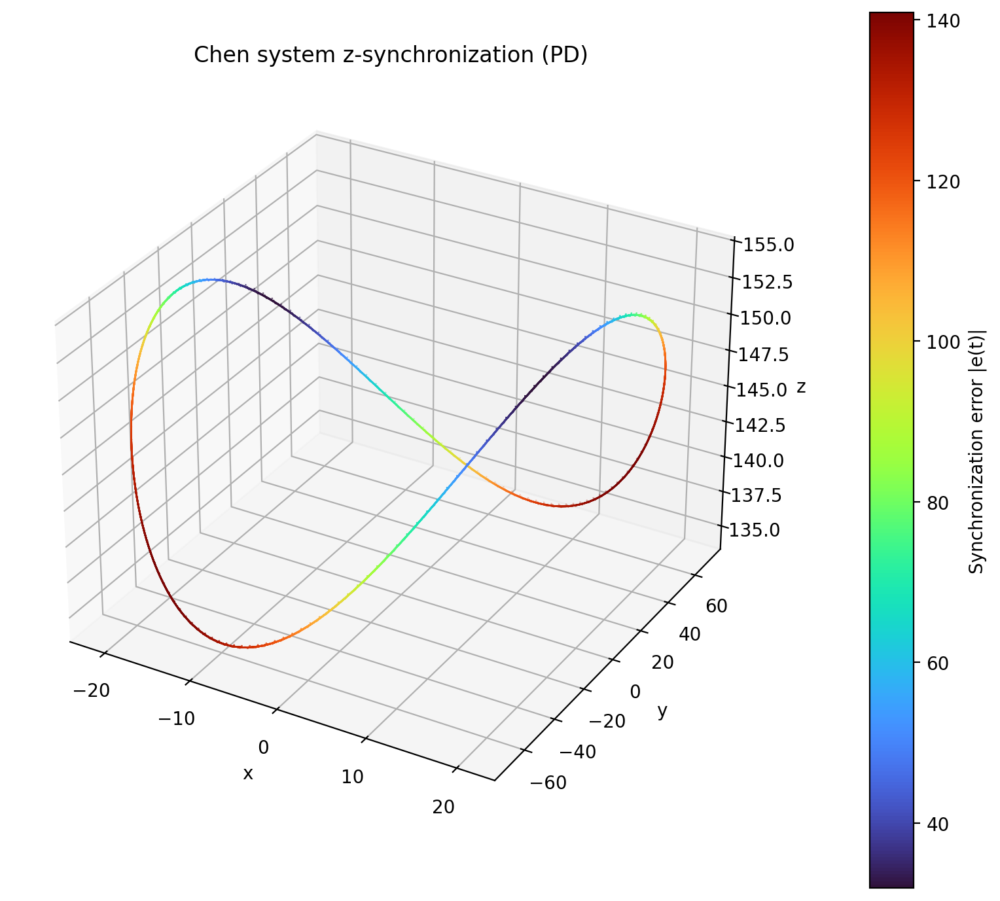

In [ ]:
method="PD"

traj1, traj2, err = simulate(
    method=method,
    coupling="bi",
    sync_vars=("x",),
    x0_1=(1.0, 1.0, 1.0),
    x0_2=(8.0, -3.0, 10.0),
    kp=0.01, kd=0.001,
    h=0.001,
    steps=25000
)

plot_sync_errors_static(err, h=0.001)
plot_errors(err, h=0.001)
plot_sync_phase_portrait(traj1, traj2, sync_var=sync_var, method=method)


In [ ]:
kp_grid = np.linspace(0, 20, 10)
kd_grid = np.linspace(0, 2, 10)

results = grid_search_kp_kd(
    kp_grid,
    kd_grid,
    coupling="uni",
    sync_vars=("x",),
    steps=15000,
    h=0.001,
    s=0.5,
    alpha=0.9
)

best = min(results, key=lambda r: r["score"])
print("BEST:", best)
plot_kp_kd_map(results)


kp=0.000, kd=0.000 → score=1.017e+01
kp=0.000, kd=0.222 → score=1.400e+01
kp=0.000, kd=0.444 → score=2.701e+01
kp=0.000, kd=0.667 → score=5.602e+01
kp=0.000, kd=0.889 → score=8.748e+01
kp=0.000, kd=1.111 → score=1.133e+02
kp=0.000, kd=1.333 → score=1.383e+02
kp=0.000, kd=1.556 → score=1.618e+02
kp=0.000, kd=1.778 → score=1.864e+02
kp=0.000, kd=2.000 → score=2.096e+02
kp=2.222, kd=0.000 → score=1.857e+01
kp=2.222, kd=0.222 → score=1.445e+01
kp=2.222, kd=0.444 → score=2.391e+01
kp=2.222, kd=0.667 → score=4.826e+01
kp=2.222, kd=0.889 → score=7.598e+01
kp=2.222, kd=1.111 → score=1.026e+02
kp=2.222, kd=1.333 → score=1.289e+02
kp=2.222, kd=1.556 → score=1.534e+02
kp=2.222, kd=1.778 → score=1.772e+02
kp=2.222, kd=2.000 → score=2.012e+02
kp=4.444, kd=0.000 → score=1.975e+01
kp=4.444, kd=0.222 → score=1.992e+01
kp=4.444, kd=0.444 → score=2.328e+01
kp=4.444, kd=0.667 → score=3.651e+01
kp=4.444, kd=0.889 → score=6.590e+01
kp=4.444, kd=1.111 → score=9.445e+01
kp=4.444, kd=1.333 → score=1.191e+02
k

KeyboardInterrupt: 